### Question 1

In [142]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import os
from sklearn.preprocessing import MinMaxScaler
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
from PIL import Image

In [143]:
df = pd.read_csv("nhl_all_games_data.csv")
df_copy = df.copy()

# Removing the datapoints that have either x or y coordinates missing.
df = df[~(df["details_xCoord"].isna() | df["details_yCoord"].isna())]

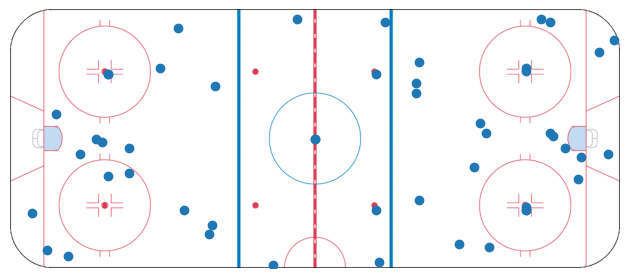

In [144]:
# Plotting the first 50 points of the df on the rink image (img.shape = (467, 1100, 4)).
scaler = MinMaxScaler(feature_range=(0, 1100))
df["details_xCoord"] = scaler.fit_transform(df[["details_xCoord"]])

scaler = MinMaxScaler(feature_range=(0, 467))
df["details_yCoord"] = scaler.fit_transform(df[["details_yCoord"]])

img = plt.imread("nhl_rink.png")
fig, ax = plt.subplots()
ax.imshow(img)
ax.scatter(df["details_xCoord"][:50], df["details_yCoord"][:50])
ax.axis('off')
plt.tight_layout()
plt.show()

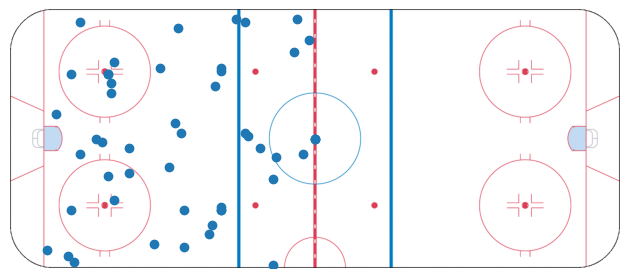

In [145]:
# Scaling all points such that they can be displayed on a rink half and plotting them.
df.loc[df["details_xCoord"]>550, "details_xCoord"] -= 550
df = df.drop(df[df["details_xCoord"]<59].index)

fig, ax = plt.subplots()
ax.imshow(img)
ax.scatter(df["details_xCoord"][:50], df["details_yCoord"][:50])
ax.axis('off')
plt.tight_layout()
plt.show()

In [146]:
def preProcess(df: pd.DataFrame) -> pd.DataFrame:
    """
    This function performs preprocessing on the dataset to make it suitable for visualization.

    output: a processed dataframe.
    """
    scaler = MinMaxScaler(feature_range=(0, 90))
    df["details_xCoord"] = scaler.fit_transform(df[["details_xCoord"]])

    scaler = MinMaxScaler(feature_range=(-42.5, 42.5))
    df["details_yCoord"] = scaler.fit_transform(df[["details_yCoord"]])

    SHOT_TYPES = {'shot-on-goal', 'goal', 'missed-shot', 'blocked-shot'}
    df = df[df['typeDescKey'].isin(SHOT_TYPES)]

    return df

df = preProcess(df)

In [147]:
def avgRate(df: pd.DataFrame) -> pd.DataFrame:
    """
    This function calculates average rate of shooting at each unique (x, y) position in the dataset.

    output: a dataframe consisting of only the column "rate".
    """
    df_temp = df.copy()
    n = df_temp["id"].nunique()
    df_temp = df_temp.groupby(["details_xCoord", "details_yCoord"]).count()
    df_temp = pd.DataFrame(df_temp.iloc[:, 0])
    df_temp.columns = ["rate"]
    df_temp /= n
    
    return df_temp

def team_id_mask(df: pd.DataFrame, team_name: str) -> pd.Series:
    """
    This function returns a boolean mask selecting shots made by the specified team.

    output: a boolean mask.
    """
    home = (df["homeTeam_commonName_default"] == team_name) & \
           (df["details_eventOwnerTeamId"] == df["homeTeam_id"])
    away = (df["awayTeam_commonName_default"] == team_name) & \
           (df["details_eventOwnerTeamId"] == df["awayTeam_id"])
    return home | away

def teamExcessRate(team: str, year: int, df: pd.DataFrame) -> pd.DataFrame:
    """
    This function calculates the excess shot rate of a team in the specified year.
    
    output: a one column dataframe consisting of the excess shot rates
    """
    df_season = df[(df.season == int(str(year)+str(year+1)))].copy()
    df_leagueRate = avgRate(df_season)/2
    
    df_team = df_season[team_id_mask(df_season, team)]
    df_teamRate = avgRate(df_team)
    df_excessRate = df_teamRate.sub(df_leagueRate, fill_value = 0)
    return df_excessRate

def shotMap(team : str, year : int, df: pd.DataFrame) -> np.array:
    
    '''
    This function computes the Z array representing the shot map.

    output: the z array of size number_x*number_y.
    '''
    
    #compute Z array
    df_rate = teamExcessRate(team, year, df)
    df_rate = df_rate.reset_index()
    [x,y] = np.round(np.meshgrid(np.linspace(0,90,91),np.linspace(-42.5,42.5,86)))
    z = griddata((df_rate['details_xCoord'], df_rate['details_yCoord']), df_rate['rate'], (x, y), method='cubic', fill_value=0)
    z = pd.DataFrame(z)*100
    #apply gaussian filter for smoothing
    z_smooth = gaussian_filter(z,sigma = 5)

    return z_smooth

def create_dropdown(team: str, teams, year: int) -> dict:
    '''
    This function creates the dropdown button of a team for a given year.

    output: a dictionnary containning the information of the dropdown button.
    '''

    return dict(label = team, method = 'update', args = [{'visible': [t == team for t in teams],
                             'title': team,
                             'showlegend': True},
                            {'title': {'text': team+' Season '+str(year)+'-'+str(year+1)}}])

def create_figure_year(year: int, df: pd.DataFrame) -> None:
    '''
    This function creates and displays the interactive offence shot map figure for a given year, and save it.

    output: None.
    '''
    fig = go.Figure()
    teams = sorted(df[df["season"] == int(str(year)+str(year+1))].homeTeam_commonName_default.unique())
    for team in teams:
        visible = False
        if team == teams[0]: visible = True
        z_smooth = shotMap(team, year, df)
        x = np.arange(0,90).astype(np.float32)
        y = np.arange(-42.5, 42.5).astype(np.float32)
        
        fig.add_trace(go.Contour(
                        z = z_smooth.T,
                        x = y, #invert xy so the plot is vertical
                        y = x,
                        colorscale=[[0, 'blue'], [0.5, 'white'], [1.0, 'red']],
                        opacity=0.4,
                        contours=dict(start=-1, end=1, size=0.1),
                        colorbar=dict(title=dict(text="Excess Shot Rate per Hour",
                                      font=dict(size=14, family="Arial, sans-serif"))),
                        visible = visible
                    ))
    fig['layout']['yaxis']['autorange'] = "reversed" #invert y axis so the plot shows relative distance to net
    fig['layout']['title']=teams[0]+' Season '+str(year)+'-'+str(year+1)
    fig['layout']['xaxis']['title']="Distance from Center of Rink (ft)"
    fig['layout']['yaxis']['title']="Distance from Net (ft)"
    fig.add_layout_image(
        dict(
            source=Image.open("nhl_rink_half.png"),
            xref="x",
            yref="y",
            x=-42.5,
            y=-11,
            sizex=85,
            sizey=101,
            opacity=1,
            sizing="stretch",
            layer="below"
        )
    )
    fig.update_xaxes(showgrid=False)
    fig.update_yaxes(showgrid=False)
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = [create_dropdown(team, teams, year) for team in teams]
            )
        ],
        showlegend=False,
        width=910,
        height=630,
        autosize=False,
        margin=dict(t=40, b=0, l=0, r=0),
        template="plotly_white",
    )
    fig.show()
    if not os.path.exists("./html"):
        os.makedirs("./html")
    fig.write_html("./html/shotMap"+str(year)+".html")
    return None

### Question 2
From the figures below, we can see the areas where the teams made most of their shots, revealing potential weaknesses in the opposing defenses. They also illustrate how each team’s offensive effectiveness evolved across different seasons.

In [148]:
create_figure_year(2016, df)

In [149]:
create_figure_year(2017, df)

In [150]:
create_figure_year(2018, df)

In [151]:
create_figure_year(2019, df)

In [152]:
create_figure_year(2020, df)

### Question 3
In 2016-17, we can see that compared to the league average shooting rate, Avalanch performed worse in most areas, evident by the larger blue areas in the plot. On the contrary, in 2020-21 the plot is dominated by red areas, i.e., Avalanche made more shots in most spots of the rink.

This is validated by considering the change of the team's standing from last to first.

### Question 4
In 2018-19, the Tampa Bay Lightning was more dominant in the center while the Buffalo Sabres, weren't able to make many shots close to the goal.
In the next year, the heatmap of the Lightning was mostly the same, whereas the attack power of the Sabres diminished.
In 2020-21, the Lightning wasn't able to make shots as close as to the goal as previous years, and the Sabres remained mostly the same.

We can glean a lot of information about the offensive capabilities of one team or the defensive prowess of the other team, just by observing the excess shooting rate heat map. 